### Final annotation and cleaning of Epithelial cells from oral mucosa


Preprocessing:
- epithelial cells from main object subsetted, then subsetted cells from oral locations (buccal and gingival mucosa, periodontium)
- performed scvi batch correction with RPL gene regression to prepare objects

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [4]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/post_scvi20221124/Oral_epi.hvg5000_noRPL.scvi_output.with_annotv2.22021124.h5ad')

In [8]:
adata

AnnData object with n_obs × n_vars = 4932 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

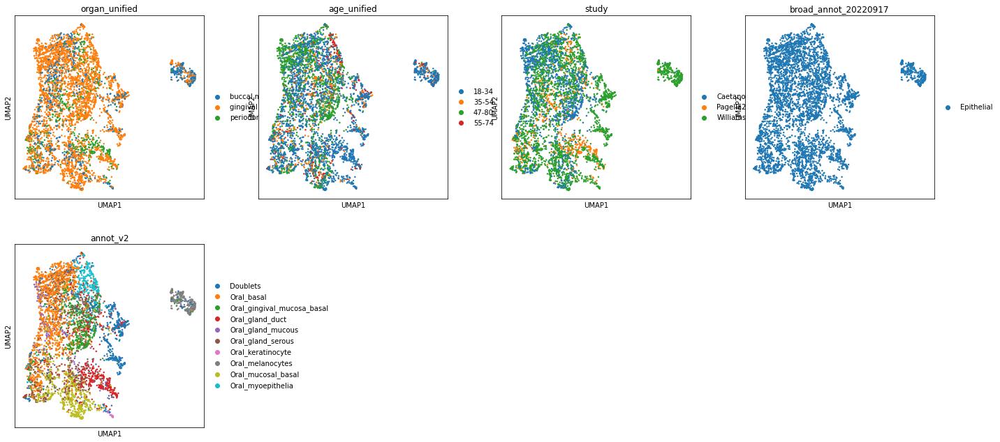

In [74]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata, color=['organ_unified', 'age_unified','study','broad_annot_20220917','annot_v2'])

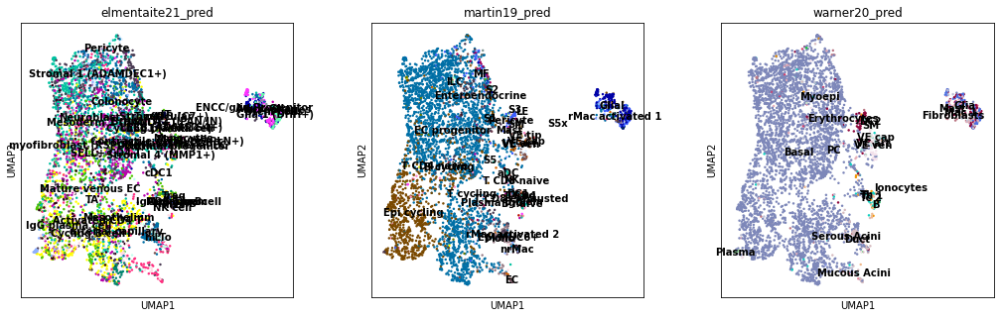

In [6]:
sc.pl.umap(adata, color=['elmentaite21_pred','martin19_pred','warner20_pred'],legend_loc='on data')

In [7]:
adata.X.max()

40330.0

In [9]:
#save raw counts in layers
adata.layers['counts'] = adata.X

Normalise and log transform

In [10]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

In [12]:
adata.X.max()

9.112011

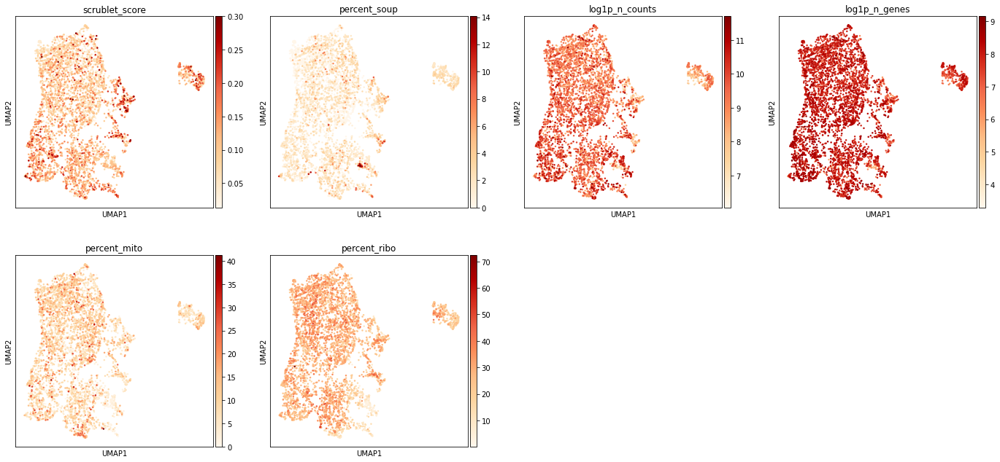

In [13]:
#plot some basic QC
sc.pl.umap(adata, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

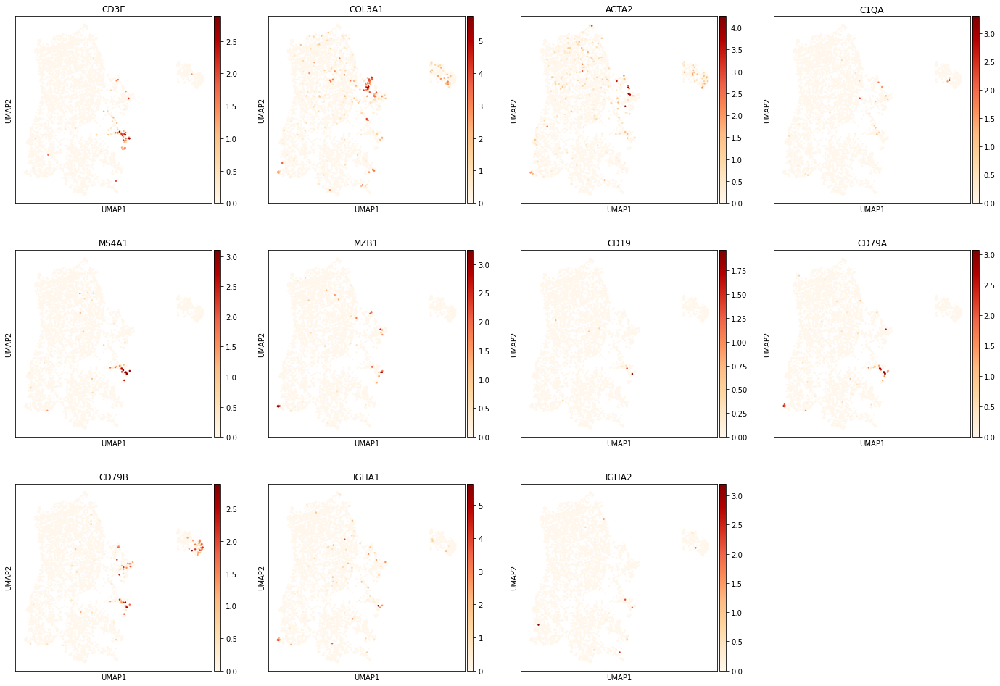

In [18]:
#plot doublet genes
sc.pl.umap(adata, color = ['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1','CD19','CD79A','CD79B','IGHA1','IGHA2'],cmap='OrRd')

In [14]:
#score cell cycle genes
cell_cycle_genes = ['MCM5',
'PCNA',
 'TYMS',
 'FEN1',
 'MCM2',
 'MCM4',
 'RRM1',
 'UNG',
 'GINS2',
 'MCM6',
 'CDCA7',
 'DTL',
 'PRIM1',
 'UHRF1',
 'MLF1IP',
 'HELLS',
 'RFC2',
 'RPA2',
 'NASP',
 'RAD51AP1',
 'GMNN',
 'WDR76',
 'SLBP',
 'CCNE2',
 'UBR7',
 'POLD3',
 'MSH2',
 'ATAD2',
 'RAD51',
 'RRM2',
 'CDC45',
 'CDC6',
 'EXO1',
 'TIPIN',
 'DSCC1',
 'BLM',
 'CASP8AP2',
 'USP1',
 'CLSPN',
 'POLA1',
 'CHAF1B',
 'BRIP1',
 'E2F8',
 'HMGB2',
 'CDK1',
 'NUSAP1',
 'UBE2C',
 'BIRC5',
 'TPX2',
 'TOP2A',
 'NDC80',
 'CKS2',
 'NUF2',
 'CKS1B',
 'MKI67',
 'TMPO',
 'CENPF',
 'TACC3',
 'FAM64A',
 'SMC4',
 'CCNB2',
 'CKAP2L',
 'CKAP2',
 'AURKB',
 'BUB1',
 'KIF11',
 'ANP32E',
 'TUBB4B',
 'GTSE1',
 'KIF20B',
 'HJURP',
 'CDCA3',
 'HN1',
 'CDC20',
 'TTK',
 'CDC25C',
 'KIF2C',
 'RANGAP1',
 'NCAPD2',
 'DLGAP5',
 'CDCA2',
 'CDCA8',
 'ECT2',
 'KIF23',
 'HMMR',
 'AURKA',
 'PSRC1',
 'ANLN',
 'LBR',
 'CKAP5',
 'CENPE',
 'CTCF',
 'NEK2',
 'G2E3',
 'GAS2L3',
 'CBX5',
 'CENPA']

In [15]:
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
adata = adata[adata.obs.G2M_score.sort_values(ascending=True).index].copy()

In [16]:
adata

AnnData object with n_obs × n_vars = 4932 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

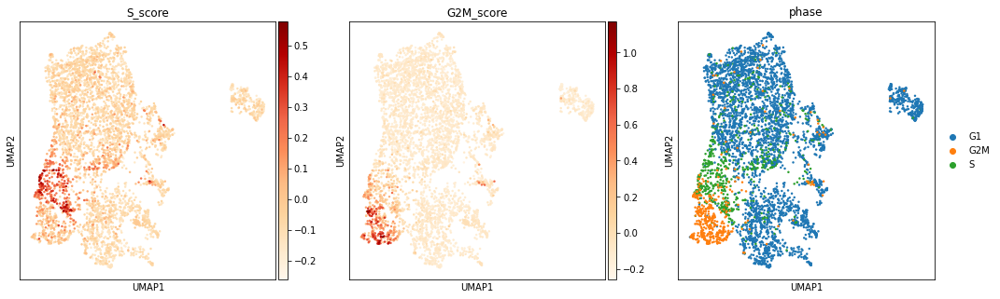

In [19]:
sc.pl.umap(adata,color=['S_score', 'G2M_score', 'phase'],cmap='OrRd')

In [81]:
sc.tl.leiden(adata, resolution = 1, neighbors_key="neighbors_scvi")

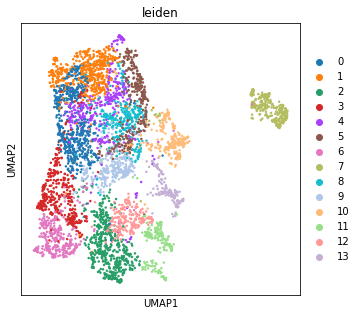

In [82]:
sc.pl.umap(adata,color='leiden')

In [27]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import * 

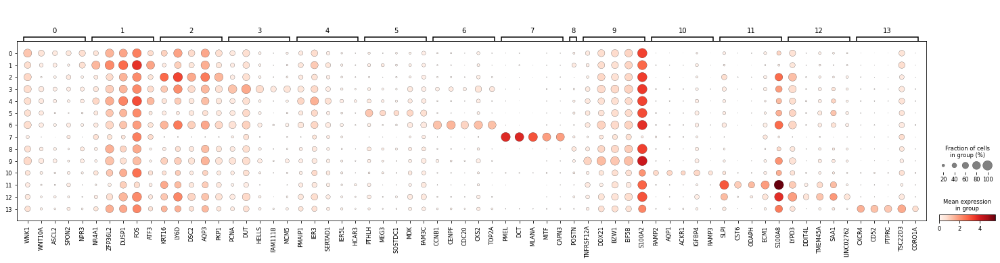

In [83]:
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='leiden', mks=mks)

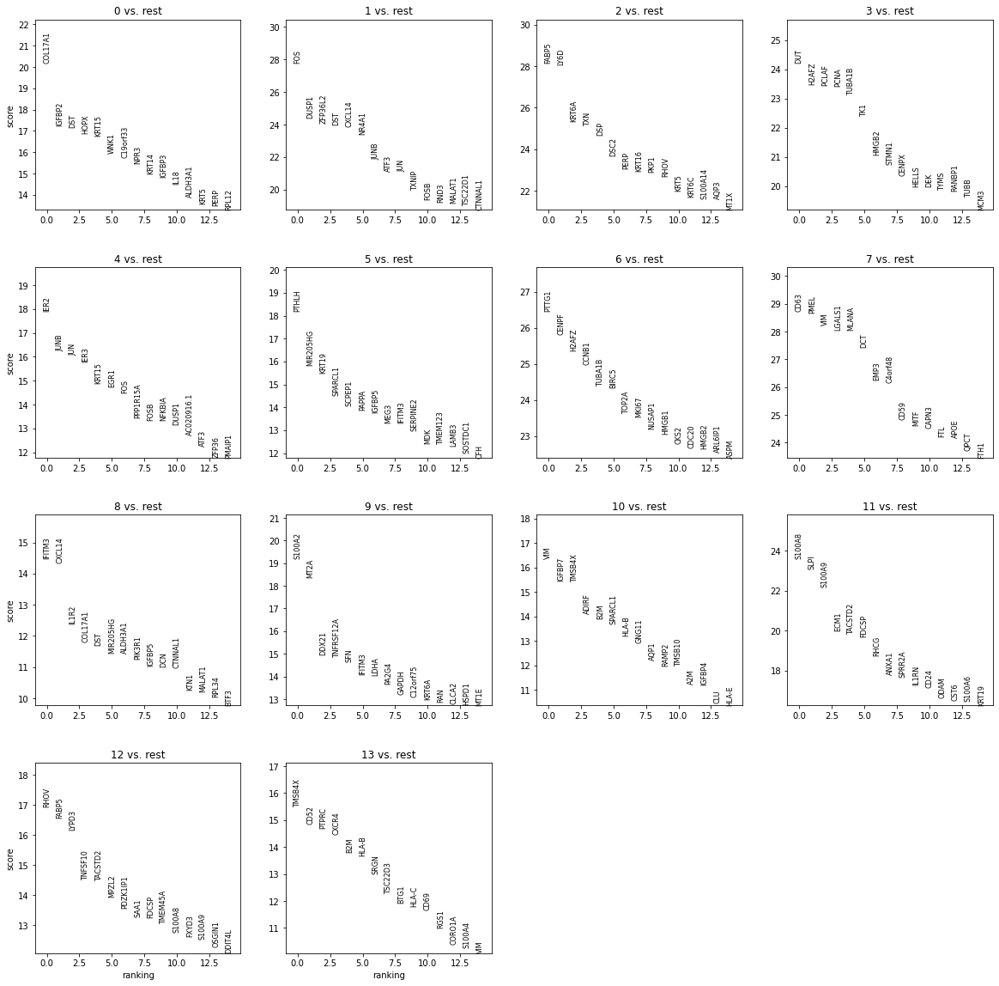

In [84]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

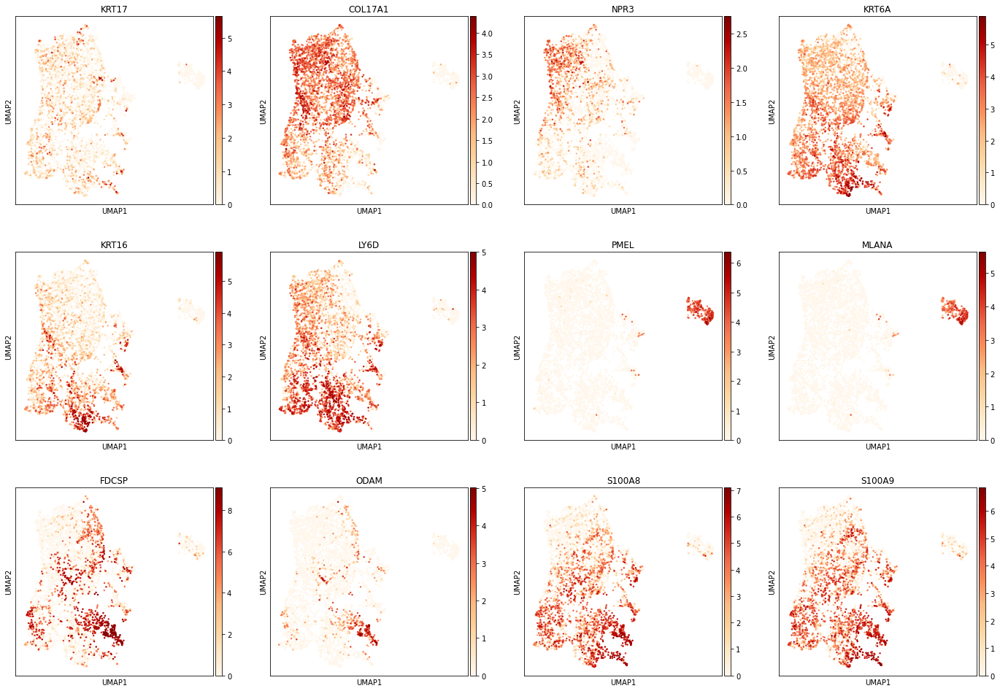

In [73]:
sc.pl.umap(adata,color=['KRT17','COL17A1','NPR3', #basal?
                       'KRT6A','KRT16','LY6D', #keratinocyte?
                       'PMEL','MLANA', #melanocyte
                       'FDCSP','ODAM','S100A8','S100A9'],cmap='OrRd')

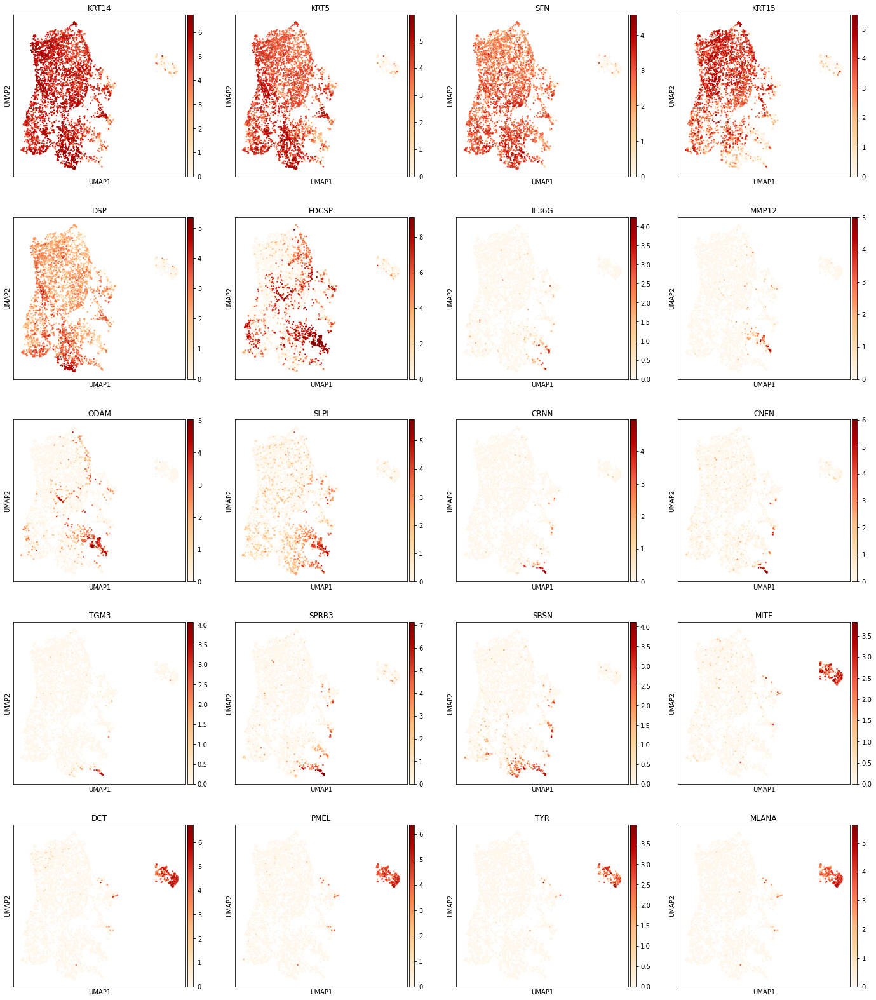

In [75]:
#williams et al markers https://www.sciencedirect.com/science/article/pii/S0092867421006309?via%3Dihub#undfig1
sc.pl.umap(adata,color=['KRT14','KRT5','SFN','KRT15','DSP', #epi1.1
                       'FDCSP','IL36G','MMP12','ODAM','SLPI',#epi1.2
                       'CRNN','CNFN','TGM3','SPRR3','SBSN',#epi1.3
                       'MITF','DCT','PMEL','TYR','MLANA'#mel
                       ],cmap='OrRd')

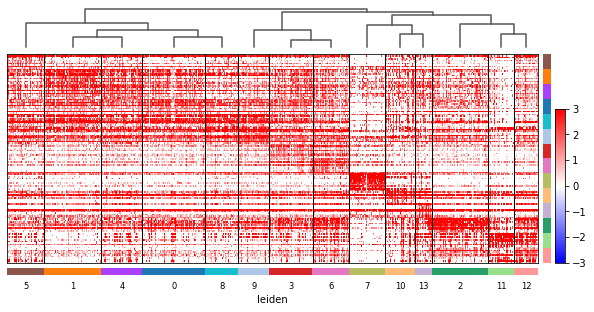

In [85]:
sc.tl.rank_genes_groups(adata,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(adata,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

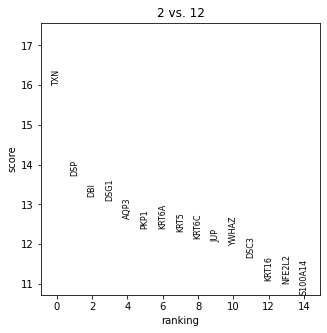

In [89]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['2'], reference='12', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['2'], n_genes=15)

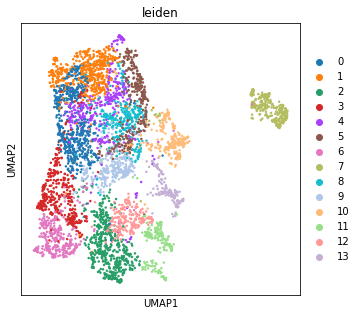

In [88]:
sc.pl.umap(adata,color='leiden')

In [141]:
new_cluster_names = [
    'Oral_basal/diff_keratinocyte','Oral_basal/diff_keratinocyte', #0,1
    'Oral_keratinocyte','Oral_cycling_S', #2,3
    'Oral_basal/diff_keratinocyte','Oral_basal/diff_keratinocyte', #4,5
    'Oral_cycling_G2M','Oral_melanocyte', #6,7
    'Oral_basal/diff_keratinocyte','Oral_basal/diff_keratinocyte',#8,9
    'Doublets','Oral_keratinocyte_outer/inflammatory',#10,11
    'Oral_keratinocyte','Doublets',#12,13

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

adata.obs['annot_v3'] = [conv[x] for x in adata.obs['leiden']]

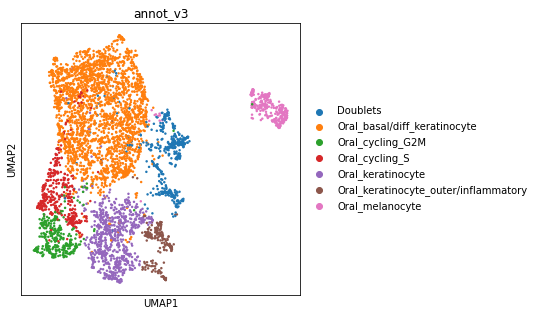

In [142]:
sc.pl.umap(adata,color='annot_v3')

In [143]:
outer = adata[adata.obs.annot_v3.isin(['Oral_keratinocyte_outer/inflammatory'])].copy()

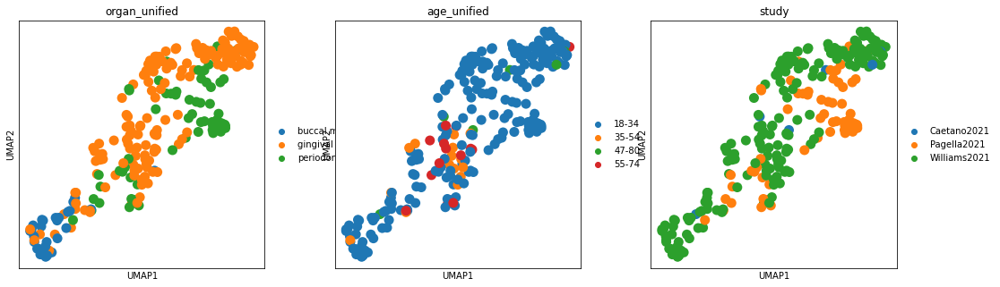

In [144]:
sc.pp.neighbors(
            outer,
            use_rep="X_scvi",
            n_pcs=outer.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(outer, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(outer, color=['organ_unified', 'age_unified','study'])

In [145]:
sc.tl.leiden(outer, resolution = 0.5, neighbors_key="neighbors_scvi")

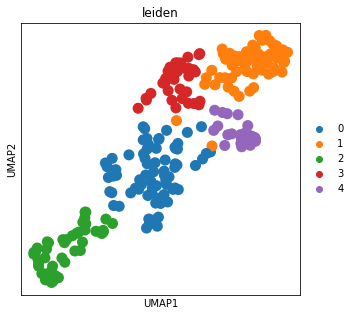

In [146]:
sc.pl.umap(outer, color=['leiden'])

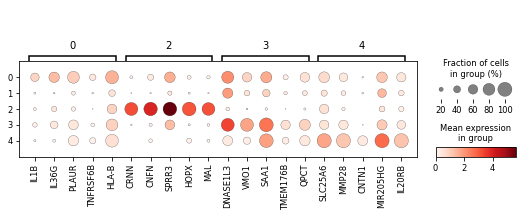

In [96]:
outer.raw = outer.copy()
mkst = calc_marker_stats(outer, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(outer, groupby='leiden', mks=mks)

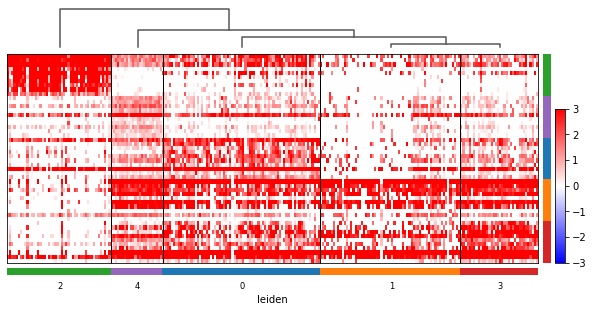

In [97]:
sc.tl.rank_genes_groups(outer,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(outer, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(outer,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

In [99]:
pd.crosstab(outer.obs.leiden,outer.obs.organ_unified)

organ_unified,buccal mucosa,gingival mucosa,periodontium
leiden,,,
0,1,58,14
1,0,54,11
2,29,15,4
3,0,28,8
4,0,0,24


In [147]:
new_cluster_names = [
    'Oral_keratinocyte_inflammatory','Oral_keratinocyte_inflammatory', #0,1
    'Oral_keratinocyte_outer','Oral_keratinocyte_inflammatory', #2,3
    'Oral_keratinocyte_inflammatory',#4

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

outer.obs['annot_v3'] = [conv[x] for x in outer.obs['leiden']]

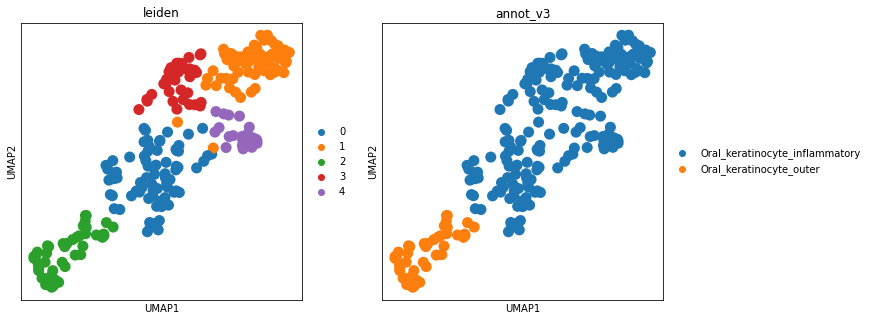

In [148]:
sc.pl.umap(outer, color=['leiden','annot_v3'])

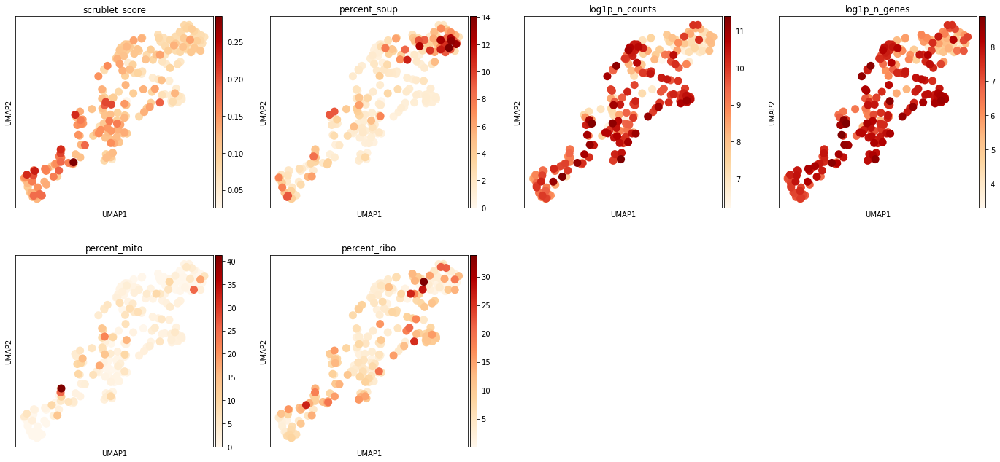

In [103]:
#plot some basic QC
sc.pl.umap(outer, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

In [149]:
ON = {O:N for O,N in zip(outer.obs_names,outer.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

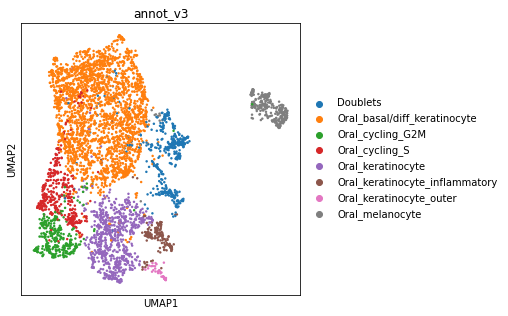

In [159]:
sc.pl.umap(adata,color='annot_v3')

Check for any remaining doublets

In [160]:
KRT = adata[adata.obs.annot_v3.isin(['Oral_keratinocyte'])].copy()

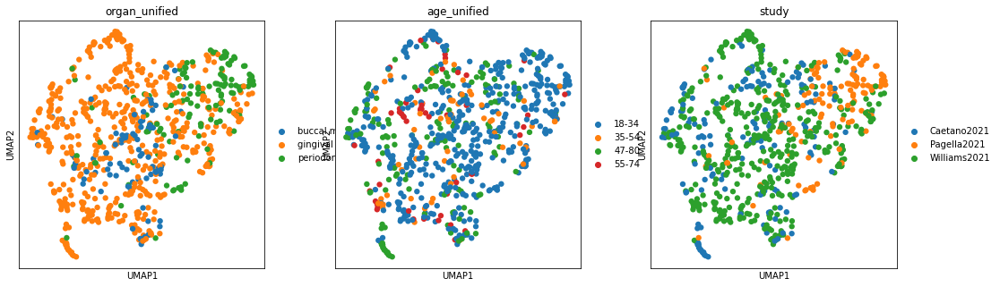

In [161]:
sc.pp.neighbors(
            KRT,
            use_rep="X_scvi",
            n_pcs=KRT.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(KRT, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(KRT, color=['organ_unified', 'age_unified','study'])

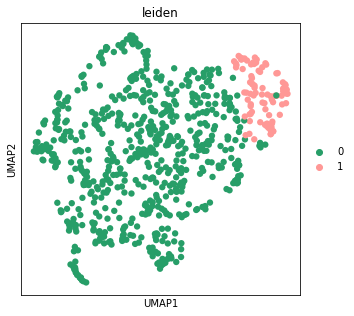

In [162]:
sc.tl.leiden(KRT, resolution = 0.2, neighbors_key="neighbors_scvi")
sc.pl.umap(KRT, color=['leiden'])

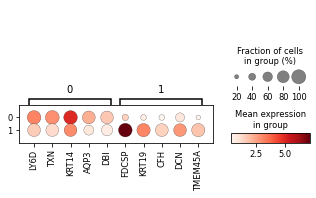

In [163]:
KRT.raw = KRT.copy()
mkst = calc_marker_stats(KRT, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(KRT, groupby='leiden', mks=mks)

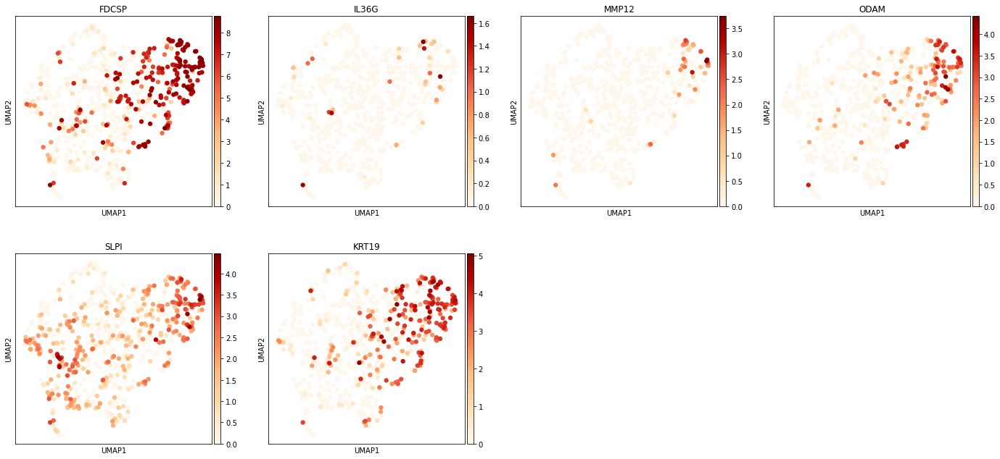

In [165]:
sc.pl.umap(KRT,color=[
                       'FDCSP','IL36G','MMP12','ODAM','SLPI',#epi1.2
                        'KRT19'
                       ],cmap='OrRd')

In [176]:
new_cluster_names = [
    'Oral_keratinocyte','Oral_keratinocyte_inflammatory' #0,1
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

KRT.obs['annot_v3'] = [conv[x] for x in KRT.obs['leiden']]

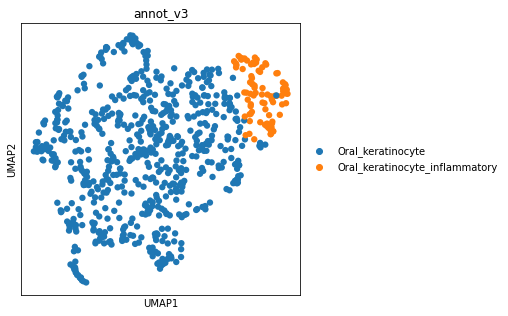

In [177]:
sc.pl.umap(KRT, color=['annot_v3'])

In [178]:
ON = {O:N for O,N in zip(KRT.obs_names,KRT.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

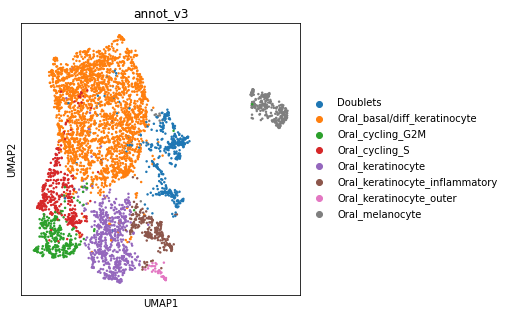

In [179]:
sc.pl.umap(adata, color=['annot_v3'])

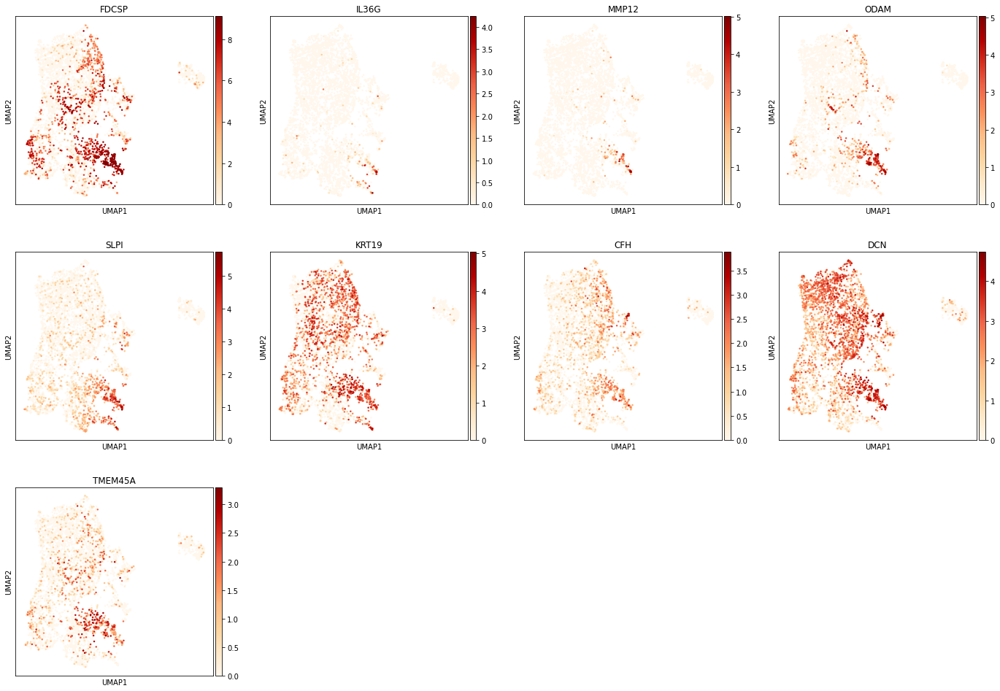

In [175]:
sc.pl.umap(adata,color=[
                       'FDCSP','IL36G','MMP12','ODAM','SLPI',#epi1.2
                        'KRT19','CFH','DCN','TMEM45A'
                       ],cmap='OrRd')

In [180]:
KRT_basal = adata[adata.obs.annot_v3.isin(['Oral_basal/diff_keratinocyte'])].copy()

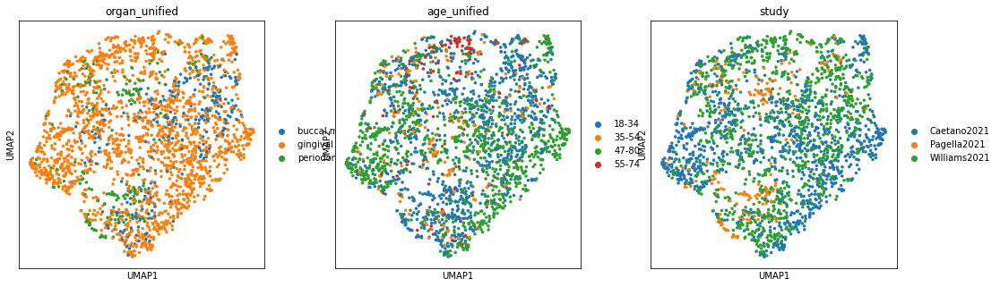

In [181]:
sc.pp.neighbors(
            KRT_basal,
            use_rep="X_scvi",
            n_pcs=KRT_basal.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(KRT_basal, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(KRT_basal, color=['organ_unified', 'age_unified','study'])

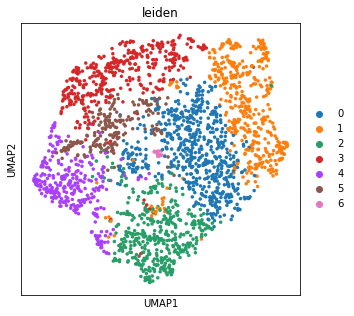

In [188]:
sc.tl.leiden(KRT_basal, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(KRT_basal, color=['leiden'])

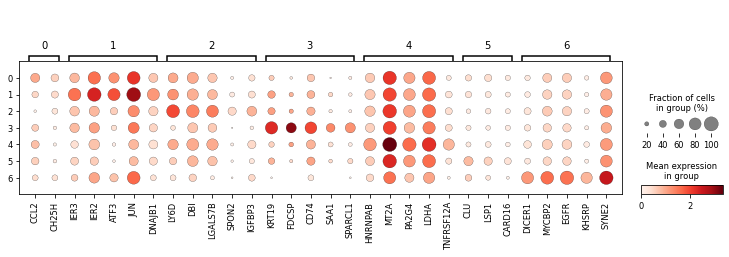

In [190]:
KRT_basal.raw = KRT_basal.copy()
mkst = calc_marker_stats(KRT_basal, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(KRT_basal, groupby='leiden', mks=mks)

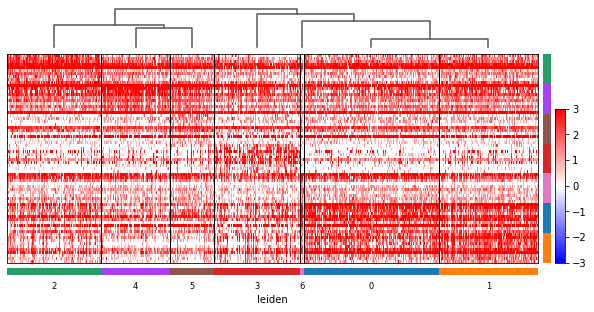

In [191]:
sc.tl.rank_genes_groups(KRT_basal,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(KRT_basal, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(KRT_basal,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

No further doublets/heterogeneity

In [194]:
mel = adata[adata.obs.annot_v3.isin(['Oral_melanocyte'])].copy()

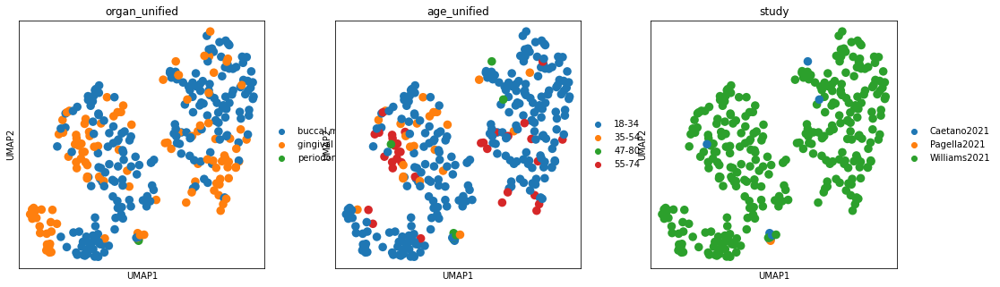

In [195]:
sc.pp.neighbors(
            mel,
            use_rep="X_scvi",
            n_pcs=mel.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(mel, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(mel, color=['organ_unified', 'age_unified','study'])

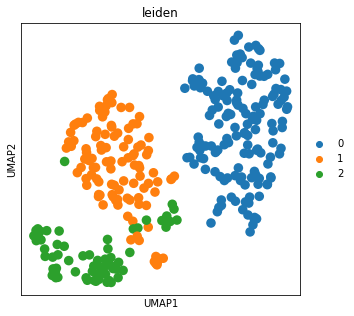

In [198]:
sc.tl.leiden(mel, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(mel, color=['leiden'])

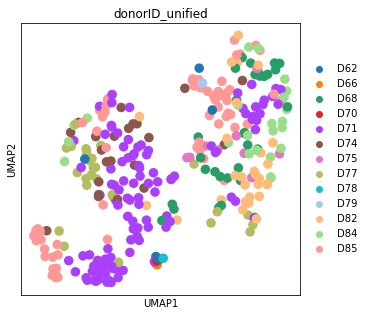

In [201]:
sc.pl.umap(mel,color='donorID_unified')

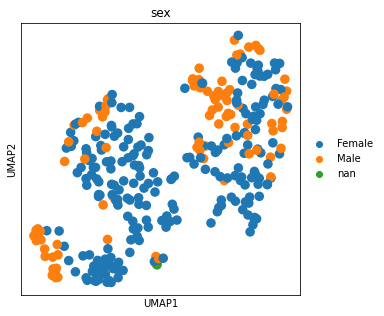

In [203]:
sc.pl.umap(mel,color='sex')

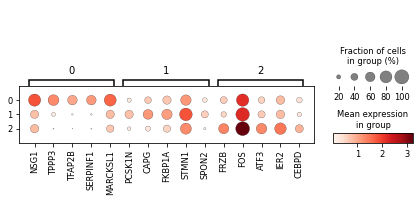

In [199]:
mel.raw = mel.copy()
mkst = calc_marker_stats(mel, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(mel, groupby='leiden', mks=mks)

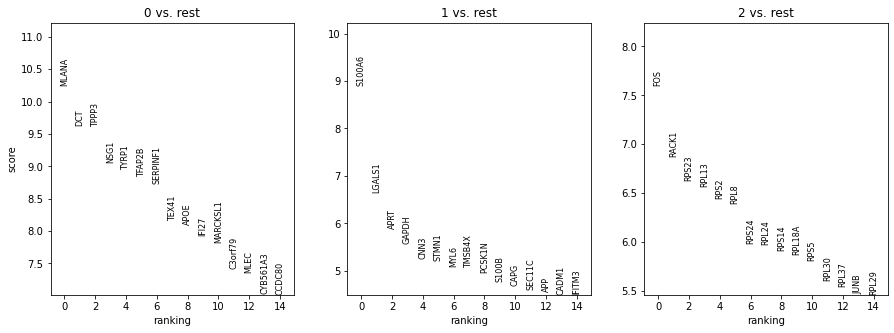

In [202]:
sc.tl.rank_genes_groups(mel, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(mel, n_genes=15, sharey=False)

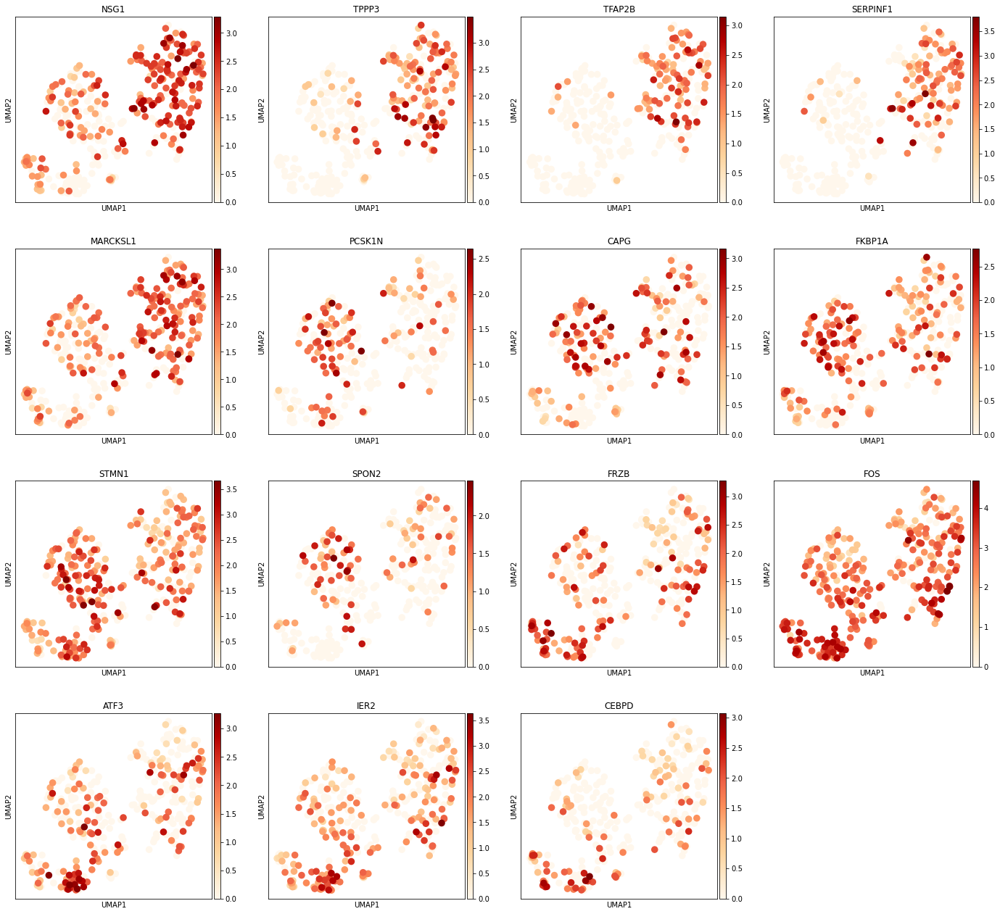

In [205]:
sc.pl.umap(mel,color=['NSG1','TPPP3','TFAP2B','SERPINF1','MARCKSL1','PCSK1N','CAPG','FKBP1A','STMN1','SPON2','FRZB','FOS','ATF3','IER2','CEBPD'],cmap='OrRd')

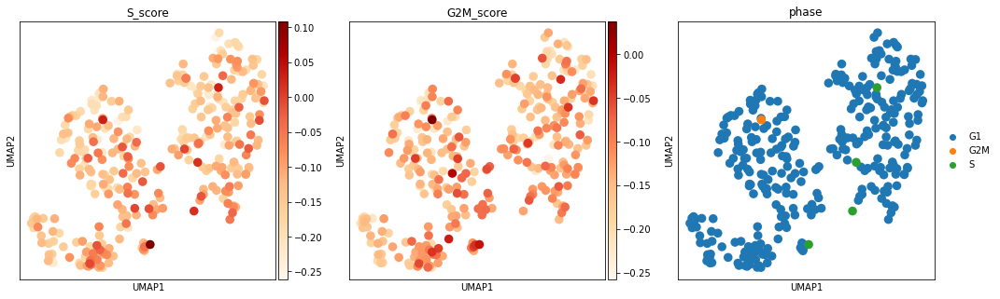

In [206]:
sc.pl.umap(mel,color=['S_score', 'G2M_score', 'phase'],cmap='OrRd')

Some apararent heterogeneity but unsure of these marker genes

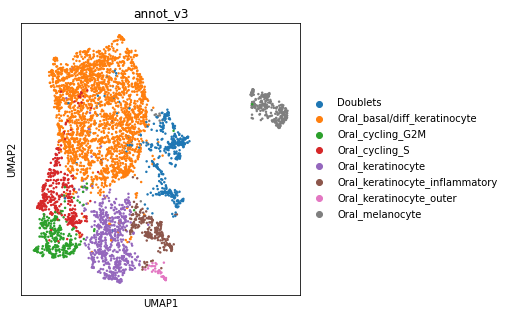

In [207]:
sc.pl.umap(adata, color=['annot_v3'])

## Export final annotations

In [208]:
adata

AnnData object with n_obs × n_vars = 4932 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

In [212]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [213]:
annot

,annot_v2,annot_v3
index,,
GAATCACTCTAAGGAA-GSM5177038,Oral_melanocytes,Oral_melanocyte
TTGTTTGTCGGTAGAG-GSM5005043,Oral_melanocytes,Oral_melanocyte
CCACCATAGCCTTCTC-GSM5177038,Oral_melanocytes,Oral_melanocyte
GGCTGTGTCTTGGAAC-GSM5005046,Oral_melanocytes,Oral_melanocyte
AGACCATAGGAGTACC-GSM5005044,Oral_gland_mucous,Oral_basal/diff_keratinocyte
...,...,...
AGCTCCTTCACCTTAT-GSM5005057,Oral_mucosal_basal,Oral_cycling_G2M
CAGGGCTAGCTGACCC-GSM4600897,Oral_mucosal_basal,Oral_cycling_G2M
CTCCACAGTGTTTCTT-GSM4600897,Oral_gland_duct,Oral_cycling_G2M


In [214]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/Oral_epi_annot_v3.csv')

In [215]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Oral_epi.hvg5000_noRPL.scvi_output.annotv3.22021125.h5ad')

Export without doublets for scvi

In [219]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()

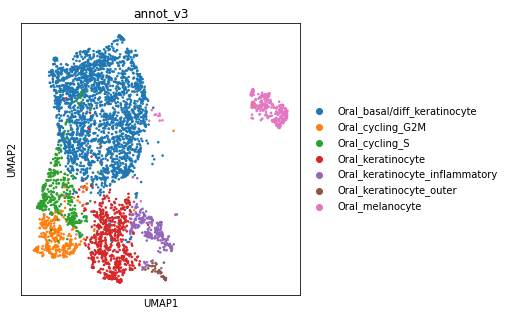

In [220]:
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [221]:
adata_nodoublets.X.max()

9.112011

In [224]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [225]:
adata_nodoublets.X.max()

40330.0

In [226]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/Oral_epi.raw.annotv3.nodoublets.22021125.h5ad')

In [3]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Oral_epi.hvg5000_noRPL.scvi_output.annotv3.22021125.h5ad')

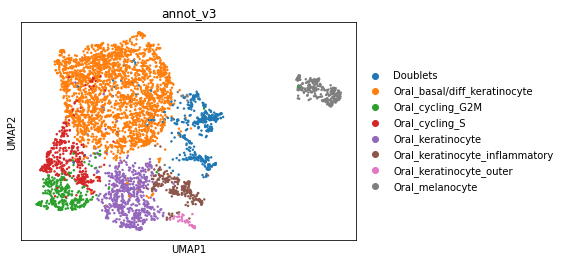

In [4]:
sc.pl.umap(adata,color='annot_v3')

In [7]:
adata.obs['annot_v3'] = (
    adata.obs["annot_v3"]
    .map(lambda x: {'Oral_keratinocyte':'Oral_keratinocyte_stratified',
                   'Oral_basal/diff_keratinocyte':'Oral_basal'}.get(x, x))
    .astype("category")
)

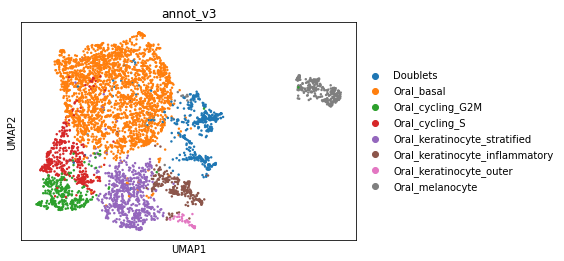

In [8]:
sc.pl.umap(adata,color='annot_v3')

In [9]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [10]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/Oral_epi_annot_v3.csv')

In [11]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Oral_epi.hvg5000_noRPL.scvi_output.annotv3.22021206.h5ad')

In [12]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()

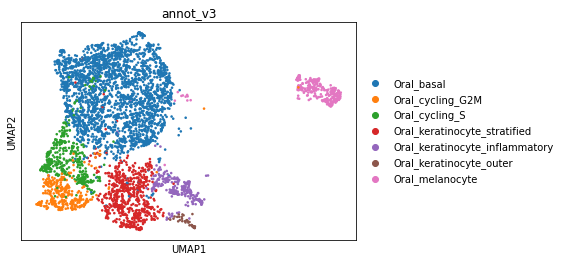

In [13]:
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [14]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [15]:
adata_nodoublets.X.max()

40330.0

In [16]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/Oral_epi.raw.annotv3.nodoublets.22021206.h5ad')

## Plot for figures

In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [3]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/no_doublets/Oral_epi.hvg5000_noRPL.scvi_output.annotv3.nodoublets.22021208.h5ad')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


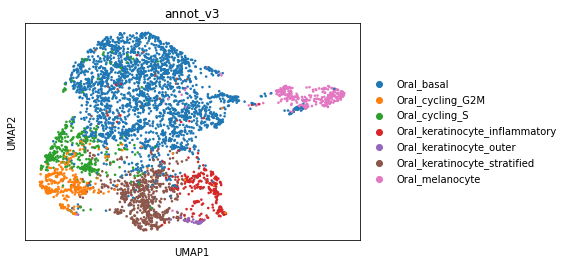

In [4]:
sc.pl.umap(adata,color='annot_v3')

In [5]:
adata.obs['fine_annot'] = adata.obs["annot_v3"].str.replace("Oral_","")

In [6]:
list(adata.obs.fine_annot.unique())

['melanocyte',
 'basal',
 'keratinocyte_stratified',
 'keratinocyte_inflammatory',
 'cycling_S',
 'keratinocyte_outer',
 'cycling_G2M']

In [7]:
adata.obs['fine_annot'] = (
    adata.obs["fine_annot"]
    .map(lambda x: {
        'melanocyte':'Melanocyte',
 'basal':'Basal',
 'keratinocyte_stratified':'Keratinocyte_stratified',
 'keratinocyte_inflammatory':'Keratinocyte_inflammatory',
 'cycling_S':'Cycling_S',
 'keratinocyte_outer':'Keratinocyte_outer',
 'cycling_G2M':'Cycling_G2M'
        
        
         }.get(x, x))
    .astype("category")
)

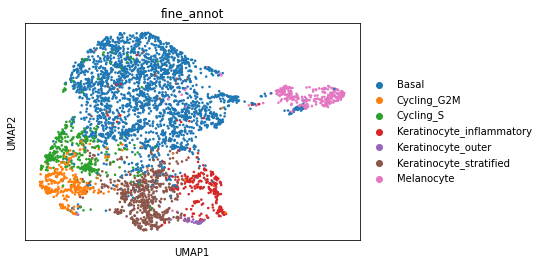

In [8]:
sc.pl.umap(adata,color='fine_annot')

In [9]:
adata.obs.fine_annot.cat.categories

Index(['Basal', 'Cycling_G2M', 'Cycling_S', 'Keratinocyte_inflammatory',
       'Keratinocyte_outer', 'Keratinocyte_stratified', 'Melanocyte'],
      dtype='object')

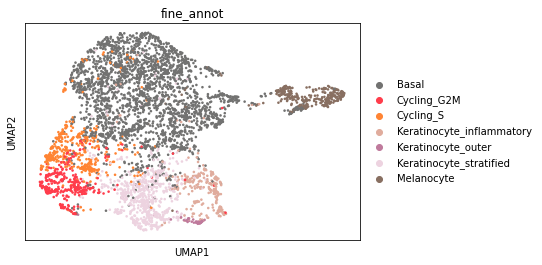

In [10]:
sc.pl.umap(adata,color='fine_annot',palette = ['#727271',#'Basal', 
    '#ff3c4b',#'Cycling_G2M', 
    '#ff8433',#'Cycling_S', 
    '#E0AC9D',#'Keratinocyte_inflammatory',
       '#BF7A9C',#'Keratinocyte_outer', 
    '#EDD3E0',#'Keratinocyte_stratified', 
    '#886F61',#'Melanocyte'
                                              ])

In [11]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

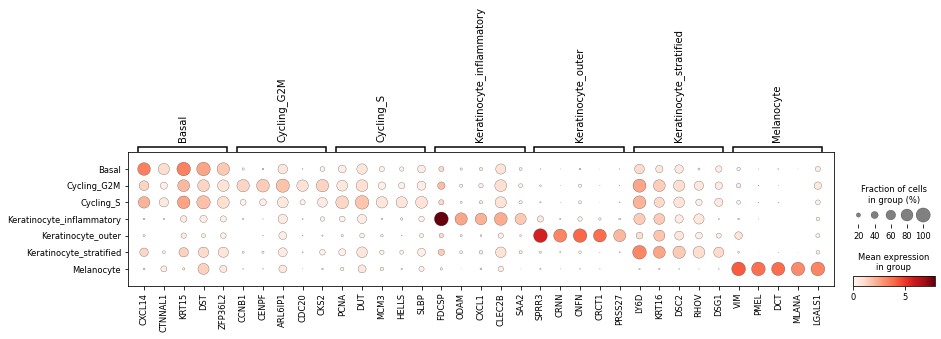

In [12]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="fine_annot")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='fine_annot', mks=mks)

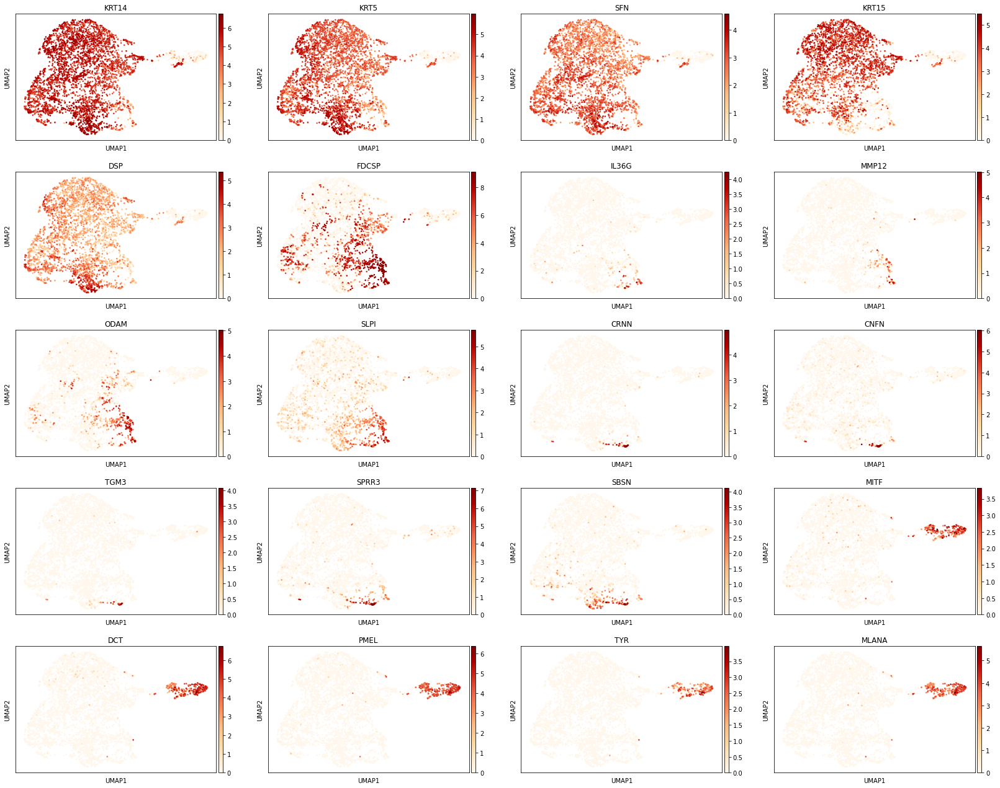

In [13]:
#williams et al markers https://www.sciencedirect.com/science/article/pii/S0092867421006309?via%3Dihub#undfig1
sc.pl.umap(adata,color=['KRT14','KRT5','SFN','KRT15','DSP', #epi1.1
                       'FDCSP','IL36G','MMP12','ODAM','SLPI',#epi1.2
                       'CRNN','CNFN','TGM3','SPRR3','SBSN',#epi1.3
                       'MITF','DCT','PMEL','TYR','MLANA'#mel
                       ],cmap='OrRd')

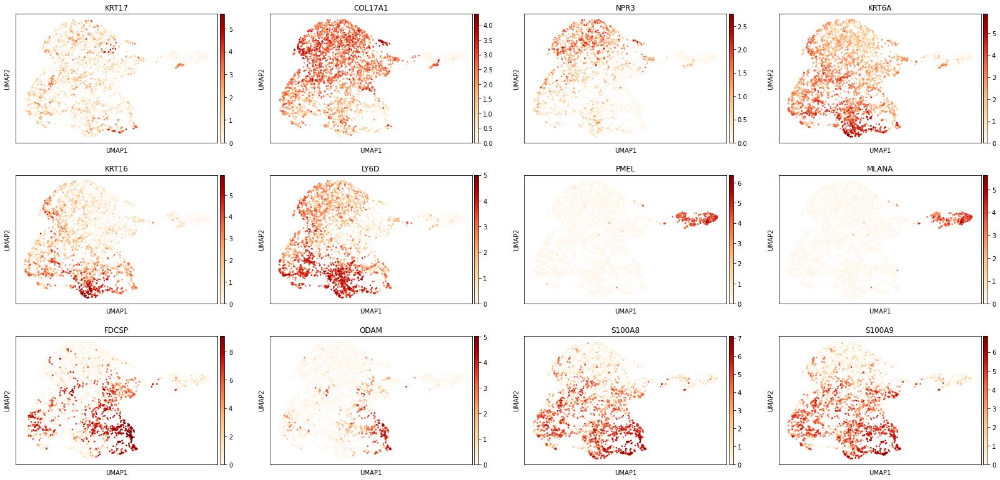

In [14]:
sc.pl.umap(adata,color=['KRT17','COL17A1','NPR3', #basal?
                       'KRT6A','KRT16','LY6D', #keratinocyte?
                       'PMEL','MLANA', #melanocyte
                       'FDCSP','ODAM','S100A8','S100A9'],cmap='OrRd')

In [15]:
marker_genes_dict = {'Basal':['KRT15','CXCL14','COL17A1','CTNNAL1'],
                     'Cycling_G2M':['CCNB1','CENPF','CDC20','CKS2'],
                     'Cycling_S':['PCNA','DUT','MCM3','HELLS','SLBP'],
                     'Keratinocyte_inflammatory':['FDCSP','ODAM','CXCL1','CLEC2B'],
                     'Keratinocyte_outer':['CRNN','CNFN','TGM3','SPRR3','SBSN','CRCT1'],
                     'Keratinocyte_stratified':['LY6D','KRT16','KRT6A','DSG1'],
                     'Melanocyte':['VIM','PMEL','MLANA']
    
    
}

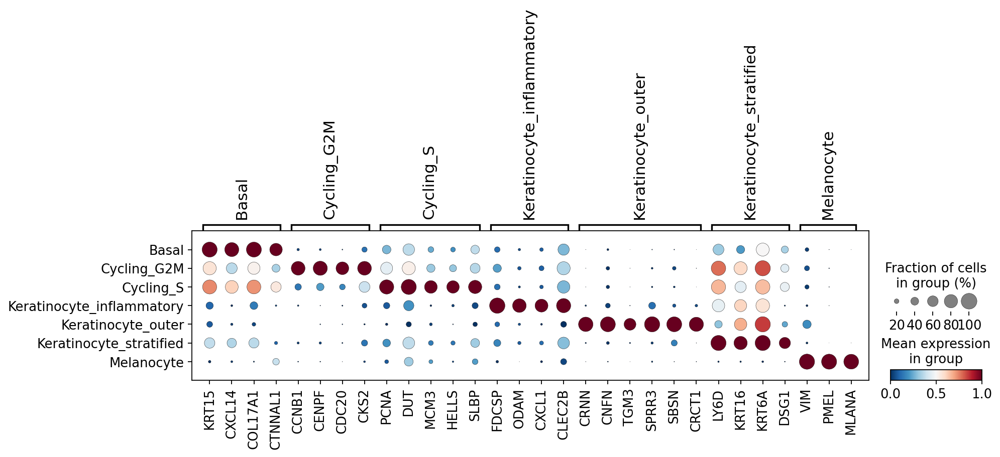

In [16]:
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_oral_markers.png',color_map='RdBu_r', standard_scale='var')

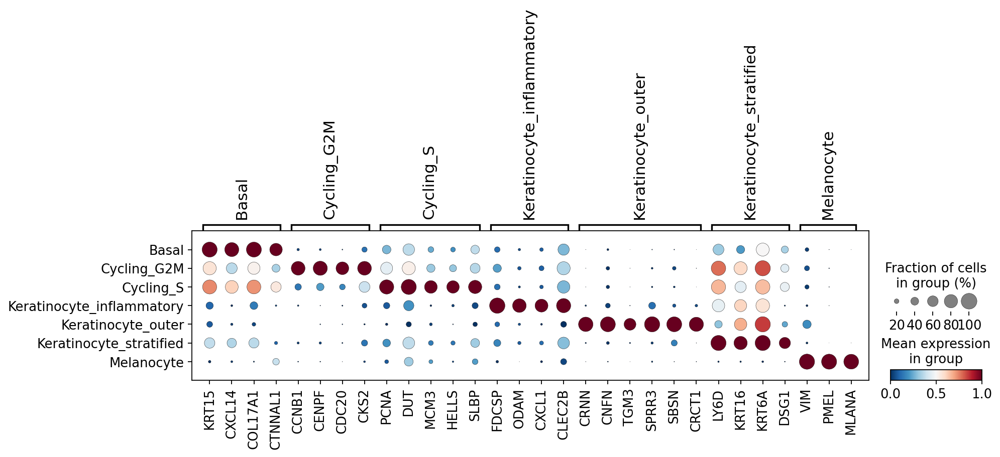

In [17]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_oral_markers.pdf',color_map='RdBu_r', standard_scale='var')

In [18]:
#make some plots for paper figures

In [19]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.figsize'] = [5,5]
sc.set_figure_params(dpi=300,dpi_save=600)

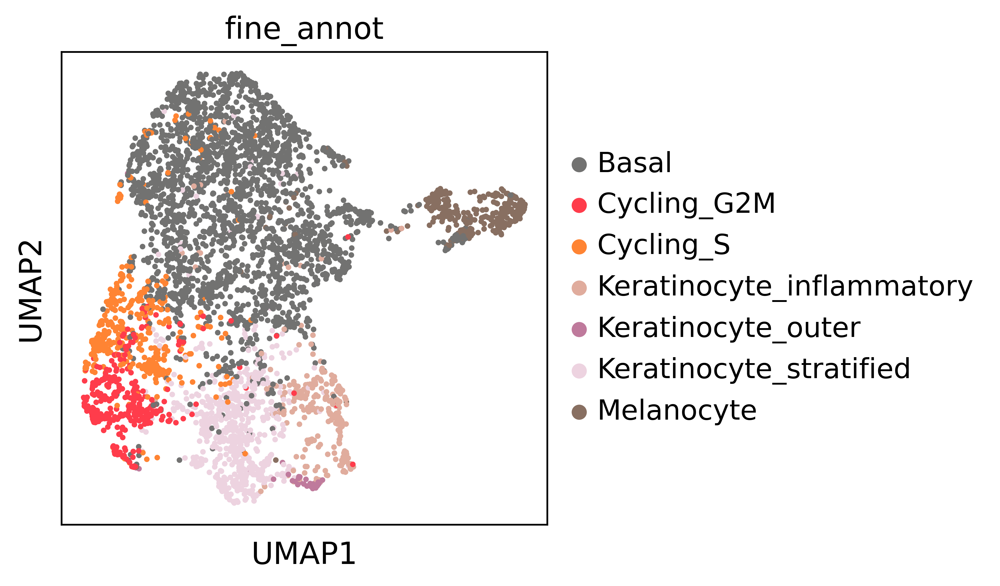

In [20]:
sc.pl.umap(adata,color='fine_annot',save='oral_epi_annot.png')

<AxesSubplot: title={'center': 'fine_annot'}, xlabel='UMAP1', ylabel='UMAP2'>

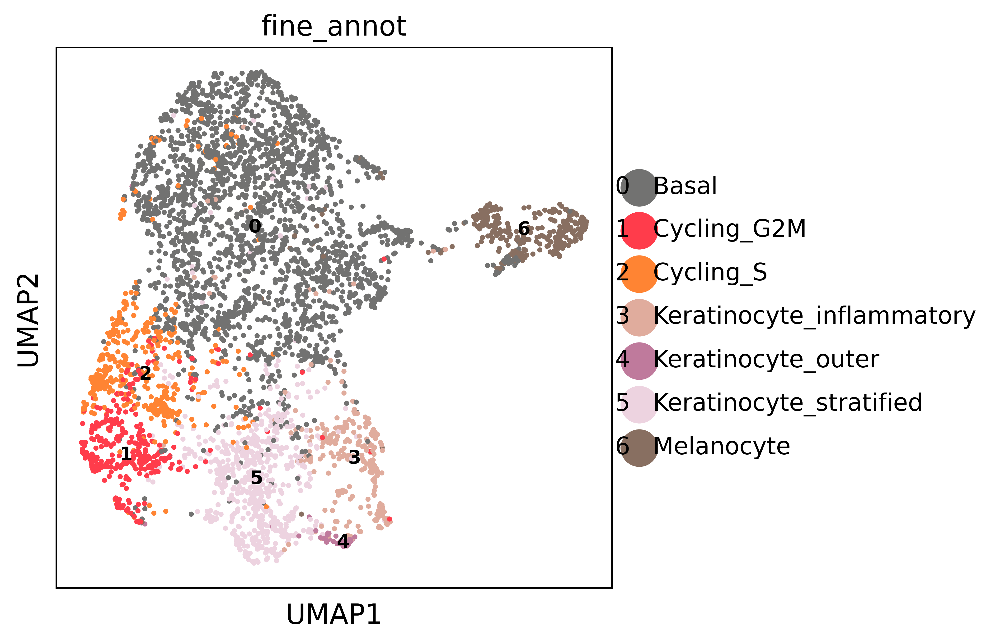

In [21]:
import sctk as sk
sk.plot_embedding(
    adata,
    basis="umap",
    groupby="fine_annot",
    figsize=(5, 5),
    save='figures/oral_epi_annot.png')